# Assn 8 Predictive Model

# Exercises 15.4

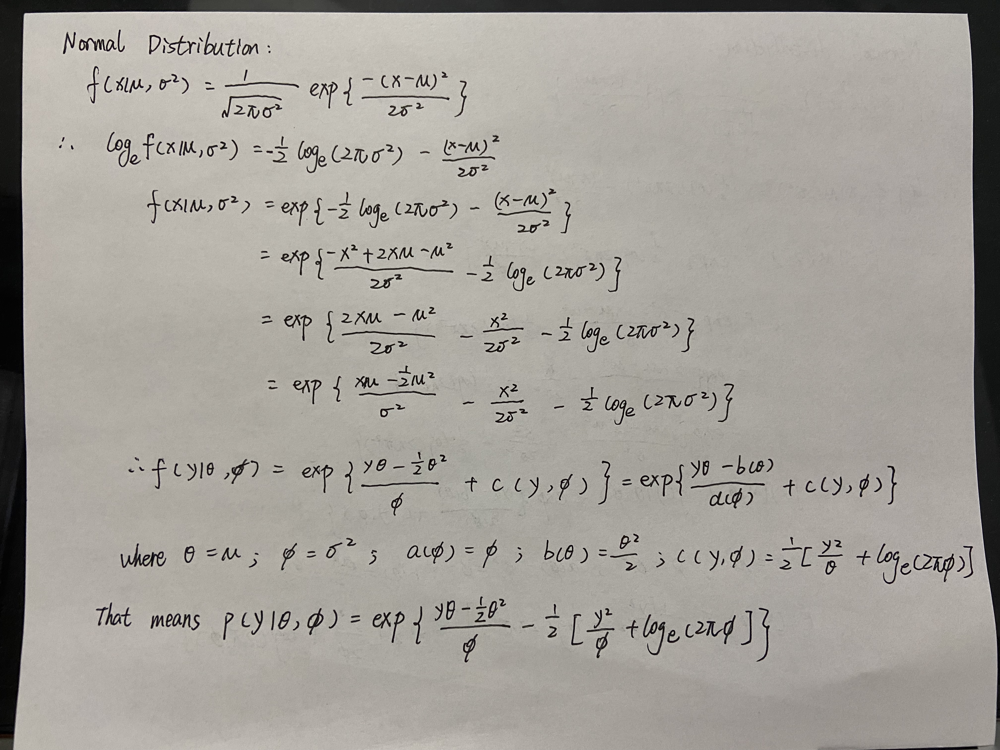

# Exercises 15.5

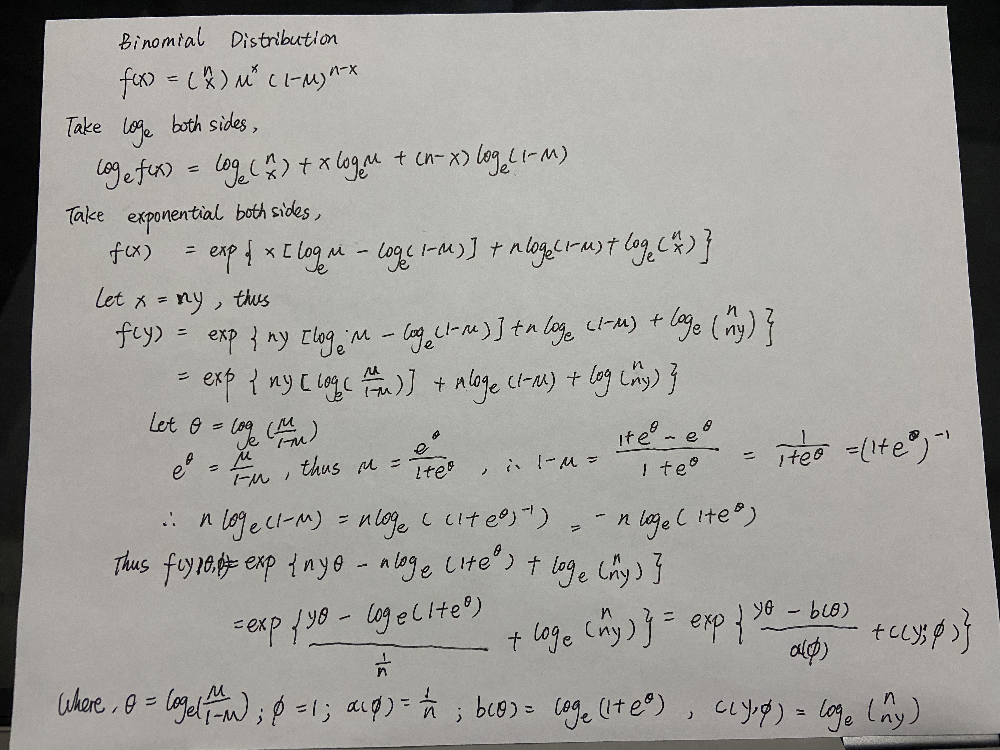

In [1]:
import pandas as pd
import re
import numpy as np
from statsmodels.formula.api import glm
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import pylab
import warnings
warnings.filterwarnings("ignore")

# Exercise 14.1

## Chile

In [2]:
df_chile = pd.read_csv('https://socialsciences.mcmaster.ca/jfox/Books/Applied-Regression-2E/datasets/Chile.txt',sep = '\t')
df_chile

,region,population,sex,age,education,income,statusquo,vote
1,N,175000,M,65.0,P,35000.0,1.00820,Y
2,N,175000,M,29.0,PS,7500.0,-1.29617,N
3,N,175000,F,38.0,P,15000.0,1.23072,Y
4,N,175000,F,49.0,P,35000.0,-1.03163,N
5,N,175000,F,23.0,S,35000.0,-1.10496,N
...,...,...,...,...,...,...,...,...
2696,M,15000,M,42.0,P,15000.0,-1.26247,N
2697,M,15000,F,28.0,P,15000.0,1.32950,Y
2698,M,15000,F,44.0,P,75000.0,1.42045,Y
2699,M,15000,M,21.0,S,75000.0,0.18315,NaN


In [3]:
df_chile.describe()

,population,age,income,statusquo
count,2700.000000,2699.000000,2602.000000,2.683000e+03
mean,152222.222222,38.548722,33875.864719,-1.118151e-08
std,102198.039602,14.756415,39502.867120,1.000186e+00
min,3750.000000,18.000000,2500.000000,-1.803010e+00
25%,25000.000000,26.000000,7500.000000,-1.002235e+00
50%,175000.000000,36.000000,15000.000000,-4.558000e-02
75%,250000.000000,49.000000,35000.000000,9.685750e-01
max,250000.000000,70.000000,200000.000000,2.048590e+00


In [4]:
df_chile.isnull().sum()

region          0
population      0
sex             0
age             1
education      11
income         98
statusquo      17
vote          168
dtype: int64

In [5]:
df_chile.dropna(inplace=True)
# drop rows are not in Y or N vote values
df_chile = df_chile[df_chile['vote'].isin(['Y','N'])]
print(len(df_chile))
df_chile.isnull().sum()

1703


region        0
population    0
sex           0
age           0
education     0
income        0
statusquo     0
vote          0
dtype: int64

### dummy regressors

In [6]:
# replace value Y to 1, N to 0 for further building model
df_chile['vote'] = np.where(df_chile['vote'].isin(['Y']), 1, 0)

# get dummy for all categorical regressor
cat_col = df_chile.select_dtypes(include=['object']).columns
for col in cat_col:
    df_chile = pd.get_dummies(df_chile, columns = [col])

df_chile

,population,age,income,statusquo,vote,region_C,region_M,region_N,region_S,region_SA,sex_F,sex_M,education_P,education_PS,education_S
1,175000,65.0,35000.0,1.00820,1,0,0,1,0,0,0,1,1,0,0
2,175000,29.0,7500.0,-1.29617,0,0,0,1,0,0,0,1,0,1,0
3,175000,38.0,15000.0,1.23072,1,0,0,1,0,0,1,0,1,0,0
4,175000,49.0,35000.0,-1.03163,0,0,0,1,0,0,1,0,1,0,0
5,175000,23.0,35000.0,-1.10496,0,0,0,1,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2692,15000,21.0,35000.0,1.22231,1,0,1,0,0,0,1,0,0,0,1
2696,15000,42.0,15000.0,-1.26247,0,0,1,0,0,0,0,1,1,0,0
2697,15000,28.0,15000.0,1.32950,1,0,1,0,0,0,1,0,1,0,0
2698,15000,44.0,75000.0,1.42045,1,0,1,0,0,0,1,0,1,0,0


In [7]:
# build a model formula with all regressors
all_columns = "+".join(df_chile.columns.drop('vote'))
my_formula = "vote~" + all_columns
my_formula

'vote~population+age+income+statusquo+region_C+region_M+region_N+region_S+region_SA+sex_F+sex_M+education_P+education_PS+education_S'

In [8]:
res_poly = glm(formula=my_formula, data=df_chile, family=sm.families.Binomial()).fit()
res_poly.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                   vote   No. Observations:                 1703
Model:                            GLM   Df Residuals:                     1691
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -351.74
Date:                Mon, 19 Jul 2021   Deviance:                       703.48
Time:                        00:03:52   Pearson chi2:                 1.70e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        0.1127      0.177      0.636      0.525      -0.235       0.460
population    1.276e-06   1.41e-06      0.902      0.367    -1.5e-06    4.05e-06
age              0.0007      0.007      0.095      0.924      -0.014       0.015
income       -2.972e-06   2.86e-06     -1.041      0.298   -8.57e-06    2.63e-06
statusquo        3.2288      0.152     21.184      0.000       2.930       3.528
region_C         0.0222      0.221      0.100      0.920      -0.411       0.455
region_M         0.7294      0.472      1.546      0.122      -0.195       1.654
region_N        -0.0774      0.260     -0.298      0.765      -0.586       0.431
region_S        -0.2823      0.199     -1.417      0.157      -0.673       0.108
region_SA       -0.2790      0.271     -1.030      0.303      -0.810       0.252
sex_F            0.3321      0.141      2.350      0.019       0.055       0.609
sex_M           -0.2194      0.129     -1.705      0.088      -0.472       0.033
education_P      0.5793      0.182      3.186      0.001       0.223       0.936
education_PS    -0.3883      0.221     -1.761      0.078      -0.821       0.044
education_S     -0.0782      0.142     -0.551      0.581      -0.356       0.200
================================================================================
"""

In [9]:
signi_detail = res_poly.pvalues[res_poly.pvalues < 0.05]
signi_detail

statusquo      1.345298e-99
sex_F          1.878561e-02
education_P    1.443075e-03
dtype: float64

The result of model shows that statusquo, sex_F, and education_P are significant regressor. I will use these regressors for building further model.

The standard error of regressor are all small that less than 0.3 except region_M which is 0.472 but still look good. 

The coefficient shows population, age, statusquo, region_C, region_M, sex_F, education_P regressor have a positive correlation to the response vote, others are negative correlation.

### 2. refit the model on only the significant regressors

In [10]:
all_columns = "+".join(signi_detail.index)
my_formula = "vote~" + all_columns
res_signi = glm(formula=my_formula, data=df_chile, family=sm.families.Binomial()).fit()
res_signi.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                   vote   No. Observations:                 1703
Model:                            GLM   Df Residuals:                     1699
Model Family:                Binomial   Df Model:                            3
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -355.23
Date:                Mon, 19 Jul 2021   Deviance:                       710.46
Time:                        00:03:52   Pearson chi2:                 1.73e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -0.3708      0.157     -2.363      0.018      -0.678      -0.063
statusquo       3.1726      0.145     21.896      0.000       2.889       3.457
sex_F           0.5842      0.202      2.896      0.004       0.189       0.979
education_P     0.8074      0.206      3.917      0.000       0.403       1.211
===============================================================================
"""

In [11]:
signi_detail = res_signi.pvalues[res_signi.pvalues < 0.05]
signi_detail

Intercept       1.814519e-02
statusquo      2.815010e-106
sex_F           3.774409e-03
education_P     8.965870e-05
dtype: float64

### 3. fit to a simpler model with *just* a constant (i.e., intercept) term

In [12]:
res_slr = glm(formula='vote~1', data=df_chile, family=sm.families.Binomial()).fit()
res_slr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                   vote   No. Observations:                 1703
Model:                            GLM   Df Residuals:                     1702
Model Family:                Binomial   Df Model:                            0
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1180.1
Date:                Mon, 19 Jul 2021   Deviance:                       2360.3
Time:                        00:03:52   Pearson chi2:                 1.70e+03
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0364      0.048     -0.751      0.453      -0.131       0.059
==============================================================================
"""

In [13]:
res_slr.pvalues[res_slr.pvalues < 0.05]

Series([], dtype: float64)

From the simple regression, the result shows that the Intercept is not significant.

### 4. compare the difference of deviances between models

In [14]:
print('siginificant regression deviance is {}'.format(res_signi.deviance))
print('siginificant regression Df Residuals is {}'.format(res_signi.df_resid))
print('simpler logistic regression deviance is {}'.format(res_slr.deviance))
print('simpler logistic regression Df Residuals is {}'.format(res_slr.df_resid))

siginificant regression deviance is 710.4587194318254
siginificant regression Df Residuals is 1699
simpler logistic regression deviance is 2360.2949675220357
simpler logistic regression Df Residuals is 1702


In [15]:
diff_df = res_slr.df_resid - res_signi.df_resid
print('difference of degree of freedom is {}'.format(diff_df))
diff_deviance = res_slr.deviance - res_signi.deviance
print('difference of deviance is {}'.format(int(diff_deviance)))

difference of degree of freedom is 3
difference of deviance is 1649


Based on the result of difference of deviances and degree of freedoms, the p value on chi square table is << 0.01

## Titanic

In [16]:
df_titanic = pd.read_csv('https://socialsciences.mcmaster.ca/jfox/Books/Applied-Regression-2E/datasets/Titanic.txt',sep='\t',names=['name','survived','age','Class','sex'])[1:]
df_titanic = df_titanic.drop('name',axis=1)
df_titanic

,survived,age,Class,sex
1,yes,29,1st,female
2,no,2,1st,female
3,no,30,1st,male
4,no,25,1st,female
5,yes,0.9167,1st,male
...,...,...,...,...
1309,no,NaN,3rd,male
1310,no,NaN,3rd,male
1311,no,NaN,3rd,male
1312,no,NaN,3rd,female


In [17]:
df_titanic['age'] = pd.to_numeric(df_titanic['age'])

In [18]:
df_titanic.describe()

,age
count,633.000000
mean,31.194181
std,14.747525
min,0.166700
25%,21.000000
50%,30.000000
75%,41.000000
max,71.000000


In [19]:
df_titanic.isnull().sum()

survived      0
age         680
Class         0
sex           0
dtype: int64

In [20]:
df_titanic.dropna(inplace=True)
print(len(df_titanic))
df_titanic.isnull().sum()

633


survived    0
age         0
Class       0
sex         0
dtype: int64

In [21]:
df_titanic.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 633 entries, 1 to 839
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   survived  633 non-null    object 
 1   age       633 non-null    float64
 2   Class     633 non-null    object 
 3   sex       633 non-null    object 
dtypes: float64(1), object(3)
memory usage: 24.7+ KB


### dummy regressors

In [22]:
# replace value Y to 1, N to 0 for further building model
df_titanic['survived'] = np.where(df_titanic['survived']=='yes', 1, 0)

# get dummy for all categorical regressor
cat_col = df_titanic.select_dtypes(include=['object']).columns
for col in cat_col:
    df_titanic = pd.get_dummies(df_titanic, columns = [col])

df_titanic

,survived,age,Class_1st,Class_2nd,Class_3rd,sex_female,sex_male
1,1,29.0000,1,0,0,1,0
2,0,2.0000,1,0,0,1,0
3,0,30.0000,1,0,0,0,1
4,0,25.0000,1,0,0,1,0
5,1,0.9167,1,0,0,0,1
...,...,...,...,...,...,...,...
834,0,32.0000,0,0,1,0,1
836,0,20.0000,0,0,1,0,1
837,0,37.0000,0,0,1,0,1
838,0,28.0000,0,0,1,0,1


In [23]:
# build a model formula with all regressors
all_columns = "+".join(df_titanic.columns.drop('survived'))
my_formula = "survived~" + all_columns
my_formula

'survived~age+Class_1st+Class_2nd+Class_3rd+sex_female+sex_male'

In [24]:
res_poly = glm(formula=my_formula, data=df_titanic, family=sm.families.Binomial()).fit()
res_poly.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:               survived   No. Observations:                  633
Model:                            GLM   Df Residuals:                      628
Model Family:                Binomial   Df Model:                            4
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -269.86
Date:                Mon, 19 Jul 2021   Deviance:                       539.71
Time:                        00:03:53   Pearson chi2:                     726.
No. Iterations:                     5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.8363      0.159      5.246      0.000       0.524       1.149
age           -0.0493      0.009     -5.647      0.000      -0.066      -0.032
Class_1st      1.7243      0.215      8.021      0.000       1.303       2.146
Class_2nd      0.2291      0.153      1.494      0.135      -0.071       0.529
Class_3rd     -1.1170      0.177     -6.299      0.000      -1.465      -0.769
sex_female     1.9615      0.163     12.036      0.000       1.642       2.281
sex_male      -1.1252      0.123     -9.125      0.000      -1.367      -0.883
==============================================================================
"""

In [25]:
signi_detail = res_poly.pvalues[res_poly.pvalues < 0.05]
signi_detail

Intercept     1.553868e-07
age           1.633840e-08
Class_1st     1.050319e-15
Class_3rd     3.004940e-10
sex_female    2.291799e-33
sex_male      7.177542e-20
dtype: float64

The result of model shows that age, Class_1st, Class_3rd, sex_female, sex_male are significant regressor. I will use these regressors for building further model.

The standard error of regressor are all small that less than 0.22. 

The coefficient shows Class_1st, Class_2nd, sex_female have a positive correlation to the response vote, others are negative correlation.

### 2. refit the model on only the significant regressors

In [26]:
all_columns = "+".join(signi_detail.index.drop('Intercept'))
my_formula = "survived~" + all_columns
res_signi = glm(formula=my_formula, data=df_titanic, family=sm.families.Binomial()).fit()
res_signi.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:               survived   No. Observations:                  633
Model:                            GLM   Df Residuals:                      628
Model Family:                Binomial   Df Model:                            4
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -269.86
Date:                Mon, 19 Jul 2021   Deviance:                       539.71
Time:                        00:03:53   Pearson chi2:                     726.
No. Iterations:                     5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.9891      0.204      4.856      0.000       0.590       1.388
age           -0.0493      0.009     -5.647      0.000      -0.066      -0.032
Class_1st      1.4952      0.282      5.302      0.000       0.943       2.048
Class_3rd     -1.3460      0.289     -4.653      0.000      -1.913      -0.779
sex_female     2.0379      0.178     11.458      0.000       1.689       2.386
sex_male      -1.0488      0.135     -7.782      0.000      -1.313      -0.785
==============================================================================
"""

In [27]:
signi_detail = res_signi.pvalues[res_signi.pvalues < 0.05]
signi_detail

Intercept     1.196310e-06
age           1.633840e-08
Class_1st     1.142363e-07
Class_3rd     3.274126e-06
sex_female    2.137115e-30
sex_male      7.133016e-15
dtype: float64

### 3. fit to a simpler model with *just* a constant (i.e., intercept) term

In [28]:
res_slr = glm(formula='survived~1', data=df_titanic, family=sm.families.Binomial()).fit()
res_slr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:               survived   No. Observations:                  633
Model:                            GLM   Df Residuals:                      632
Model Family:                Binomial   Df Model:                            0
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -434.77
Date:                Mon, 19 Jul 2021   Deviance:                       869.54
Time:                        00:03:53   Pearson chi2:                     633.
No. Iterations:                     4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.2253      0.080     -2.816      0.005      -0.382      -0.068
==============================================================================
"""

In [29]:
res_slr.pvalues[res_slr.pvalues < 0.05]

Intercept    0.004862
dtype: float64

From the simple regression model, the result shows that the Intercept is a significant constant.

### 4. compare the difference of deviances between models

In [30]:
print('siginificant regression deviance is {}'.format(res_signi.deviance))
print('siginificant regression Df Residuals is {}'.format(res_signi.df_resid))
print('simpler logistic regression deviance is {}'.format(res_slr.deviance))
print('simpler logistic regression Df Residuals is {}'.format(res_slr.df_resid))

siginificant regression deviance is 539.7149340933436
siginificant regression Df Residuals is 628
simpler logistic regression deviance is 869.5438826479015
simpler logistic regression Df Residuals is 632


In [31]:
diff_df = res_slr.df_resid - res_signi.df_resid
print('difference of degree of freedom is {}'.format(diff_df))
diff_deviance = res_slr.deviance - res_signi.deviance
print('difference of deviance is {}'.format(int(diff_deviance)))

difference of degree of freedom is 4
difference of deviance is 329


Based on the result of difference of deviances and degree of freedoms, the p value on chi square table is << 0.01

# Exercise 15.1

In [32]:
df_long = pd.read_csv('https://socialsciences.mcmaster.ca/jfox/Books/Applied-Regression-2E/datasets/Long.txt')
long = []
for i in range(len(df_long)):
    long.append(re.sub('\s+',' ', str(df_long.iloc[i,].values[0])).split(' '))
df_long = pd.DataFrame(long).iloc[:,2:].apply(pd.to_numeric, errors='ignore')
df_long.columns = ['fem','ment','phd','mar','kid5','art']
df_long

,fem,ment,phd,mar,kid5,art
0,0,8,1.38,1,2,3
1,0,7,4.29,0,0,0
2,0,47,3.85,0,0,4
3,0,19,3.59,1,1,1
4,0,0,1.81,1,0,1
...,...,...,...,...,...,...
910,1,0,2.12,1,0,1
911,1,5,3.75,0,0,2
912,1,0,0.76,0,0,0
913,1,7,2.25,0,0,1


In [33]:
df_long.describe()

,fem,ment,phd,mar,kid5,art
count,915.000000,915.000000,915.000000,915.000000,915.000000,915.000000
mean,0.460109,8.767213,3.103093,0.662295,0.495082,1.692896
std,0.498679,9.483916,0.984274,0.473186,0.764880,1.926069
min,0.000000,0.000000,0.760000,0.000000,0.000000,0.000000
25%,0.000000,3.000000,2.260000,0.000000,0.000000,0.000000
50%,0.000000,6.000000,3.150000,1.000000,0.000000,1.000000
75%,1.000000,12.000000,3.920000,1.000000,1.000000,2.000000
max,1.000000,77.000000,4.620000,1.000000,3.000000,19.000000


In [34]:
df_long.isnull().sum()

fem     0
ment    0
phd     0
mar     0
kid5    0
art     0
dtype: int64

### Part(a)

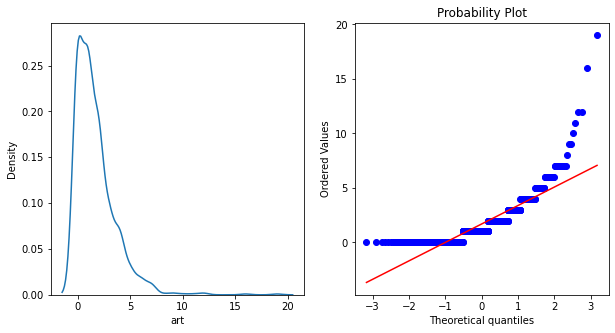

In [35]:
#function to return plots for the feature
def normality(data,feature):
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    sns.kdeplot(data[feature])
    plt.subplot(1,2,2)
    stats.probplot(data[feature],plot=pylab)
    plt.show()
    
normality(df_long,'art')

The response variable is quite unbalanced in the hist diagram and it's a right skewed data. The QQ plot also shows it's not fit to the standard normal line.

In [36]:
x = df_long.iloc[:, :-1]
y = df_long.iloc[:, -1]
x = sm.add_constant(x)
model = sm.OLS(y, x)
res_OLS = model.fit()
print(res_OLS.summary())

                            OLS Regression Results                            
Dep. Variable:                    art   R-squared:                       0.110
Model:                            OLS   Adj. R-squared:                  0.105
Method:                 Least Squares   F-statistic:                     22.55
Date:                Mon, 19 Jul 2021   Prob (F-statistic):           2.28e-21
Time:                        00:03:55   Log-Likelihood:                -1844.1
No. Observations:                 915   AIC:                             3700.
Df Residuals:                     909   BIC:                             3729.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.3343      0.241      5.538      0.0

In [37]:
results_detail = res_OLS.pvalues[res_OLS.pvalues < 0.05]
results_detail

const    3.994603e-08
fem      3.032285e-03
ment     9.342635e-20
kid5     1.395290e-03
dtype: float64

Before tranform the response variable, regressors fem, ment, kid5 are significant whereas phd and mar are not.

### transform the response variable

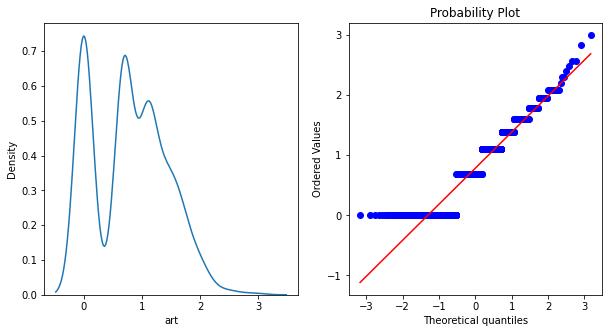

In [38]:
df_long['art'] = np.log(1+df_long.art)
normality(df_long,'art')

I used the log to transform the data. Since the data includes 0 value so added 1 to avoid error.

By looking at the new hist diagram and QQ plot. The distribution of response variable art is close to standard normal.

In [39]:
x = df_long.iloc[:, :-1]
y = df_long.iloc[:, -1]
x = sm.add_constant(x)
model = sm.OLS(y, x)
res_OLS_trans = model.fit()
print(res_OLS_trans.summary())

                            OLS Regression Results                            
Dep. Variable:                    art   R-squared:                       0.105
Model:                            OLS   Adj. R-squared:                  0.100
Method:                 Least Squares   F-statistic:                     21.31
Date:                Mon, 19 Jul 2021   Prob (F-statistic):           3.42e-20
Time:                        00:03:55   Log-Likelihood:                -824.47
No. Observations:                 915   AIC:                             1661.
Df Residuals:                     909   BIC:                             1690.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5970      0.079      7.553      0.0

In [40]:
results_detail = res_OLS_trans.pvalues[res_OLS_trans.pvalues < 0.05]
results_detail

const    1.038901e-13
fem      1.355494e-02
ment     5.531453e-18
mar      4.345817e-02
kid5     9.935313e-04
dtype: float64

After tranform the response variable, regressors fem, ment, mar, kid5 are significant whereas phd is not.

The standard error of regressor are quite samll and all less than 0.08. 

The coefficient shows ment, phd	, mar have a positive correlation to the response vote, others are negative correlation.

### Part(b)

In [41]:
res_Possion = glm('art ~ fem + ment + phd + mar + kid5', data=df_long, family=sm.families.Poisson()).fit()
res_Possion.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                    art   No. Observations:                  915
Model:                            GLM   Df Residuals:                      909
Model Family:                 Poisson   Df Model:                            5
Link Function:                    log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -942.07
Date:                Mon, 19 Jul 2021   Deviance:                       572.99
Time:                        00:03:55   Pearson chi2:                     431.
No. Iterations:                     5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.4853      0.151     -3.208      0.001      -0.782      -0.189
fem           -0.1316      0.080     -1.654      0.098      -0.287       0.024
ment           0.0189      0.003      5.854      0.000       0.013       0.025
phd            0.0314      0.039      0.804      0.421      -0.045       0.108
mar            0.1227      0.090      1.367      0.172      -0.053       0.299
kid5          -0.1321      0.058     -2.271      0.023      -0.246      -0.018
==============================================================================
"""

In [42]:
results_detail = res_Possion.pvalues[res_Possion.pvalues < 0.05]
results_detail

Intercept    1.336221e-03
ment         4.805206e-09
kid5         2.312612e-02
dtype: float64

In possion regression model, regressors ment, kid5 are significant whereas fem, phd, mar are not.

The standard error of regressor are all small that less than 0.15. 

The coefficient shows ment, phd	, mar have a positive correlation to the response vote, others are negative correlation.